# Image-based DQN

### Preprocessing

In order to reduce the size of the input to DQN, we perform the first preprocessing step by converting the original RGB image frame into a 2D 84x84 input frame.

This is done by performing the preprocessing function between a pair of frames. So, imagine you get 5 raw frames (3D), then you convert frames t-1 and t into 1 single preprocessed frame. In the end, you'll end up with 4 preprocessed frames ready to input into the DQN.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def preprocess(prev_frame: np.ndarray, current_frame: np.ndarray) -> np.ndarray:
  """
  Preprocess the input frames to get a 3D array (rows x cols x channels)

  Args:
    - prev_frame (str): path to the image
    - current_frame (str): path to the image

  Logic:
    - Read both frames into 3D arrays
    - Get the new frame by taking the maximum pixel values element-wise between both frames
    - Convert the image into gray scale
    - Rescale the image into a 2D array with size 84x84

  Output:
    - rescaled_img: a 2D array (84x84)
  """
  new_frame = np.maximum(prev_frame, current_frame)
  gray_img = cv2.cvtColor(new_frame, cv2.COLOR_RGB2GRAY)
  rescaled_img = cv2.resize(gray_img, (84, 84), interpolation=cv2.INTER_AREA)
  return rescaled_img

In [ ]:
from collections import deque

In [ ]:
class FrameBuffer:
  """
  Maintains a buffer of the last 4 preprocessed frames.
  Handles initial steps by repeating the first frame.
  """
  def __init__(self, frame_shape=(84,84)):
    """Initialize the attributes of the frame buffer object
    - frame shape is 2D (84x84)
    - the buffer size is 4
    """
    self.frame_shape = frame_shape
    self.buffer = deque(maxlen=4)

  def add_frame(self, frame: np.ndarray) -> np.ndarray:
    """Add a new frame to the buffer and return stacked frames

    Args:
      frame: preprocessed frame of shape (84, 84)

    Returns:
      stacked frames of shape (4, 84, 84) ready for DQN input
    """
    if len(self.buffer) == 0:
      for _ in range(4):
        self.buffer.append(frame)
    else:
      self.buffer.append(frame)

    return np.array(self.buffer)

  def reset(self):
    self.buffer.clear()

  def get_stacked_frames(self) -> np.ndarray:
    return np.array(self.buffer)

In [ ]:
def process_obs(prev_frame: np.ndarray,
                curr_frame: np.ndarray,
                frame_buffer: FrameBuffer, env) -> np.ndarray:
  """
  Process two observations (prev_frame and curr_frame) into DQN-ready input

  Args:
    prev_frame: raw vector of pixels from env
    curr_frame: raw vector of pixels from env
    frame_buffer: FrameBuffer instance
    env: Environment instance (for rendering)

  Returns:
    Stacked frames of shape (84, 84, 4) ready for DQN
  """
  preprocessed_frame = preprocess(prev_frame, curr_frame)
  stacked = frame_buffer.add_frame(preprocessed_frame)
  return stacked

## DQN



### Calculate Convolutional Output

In [ ]:
def conv2d_output_size(input_size, kernel_size, stride, padding=0):
  if isinstance(input_size, tuple):
    h, w = input_size
    if isinstance(kernel_size, tuple):
      k_h, k_w = kernel_size
    else:
      k_h = k_w = kernel_size
    if isinstance(stride, tuple):
            s_h, s_w = stride
    else:
        s_h = s_w = stride
    if isinstance(padding, tuple):
            p_h, p_w = padding
    else:
        p_h = p_w = padding

    o_h = (h - k_h + 2 * p_h) // s_h + 1
    o_w = (w - k_w + 2 * p_w) // s_w + 1
    return (int(o_h), int(o_w))
  else:
    k = kernel_size if isinstance(kernel_size, int) else kernel_size[0]
    s = stride if isinstance(stride, int) else stride[0]
    p = padding if isinstance(padding, int) else padding[0]
    return int((input_size - k + 2 * p) // s + 1)

### Architecture

In [ ]:
import torch
import random
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [ ]:
class DQN(nn.Module):
  def __init__(self, num_actions):
    super().__init__()
    self.conv = nn.Sequential(
        nn.Conv2d(4, 32, kernel_size=8, stride=4),
        nn.ReLU(),
        nn.Conv2d(32, 64, kernel_size=4, stride=2),
        nn.ReLU(),
        nn.Conv2d(64, 64, kernel_size=3, stride=1),
        nn.ReLU(),
    )

    with torch.no_grad():
      dummy = torch.zeros(1, 4, 84, 84)
      n_flat = self.conv(dummy).view(1, -1).size(1)

    self.fc = nn.Sequential(
        nn.Linear(n_flat, 512),
        nn.ReLU(),
        nn.Linear(512, num_actions)
    )

  def forward(self, x):
    x = self.conv(x)
    x = x.reshape(x.size(0), -1)
    return self.fc(x)

In [ ]:
class ReplayBuffer:
    def __init__(self, capacity):
        self.buffer = deque(maxlen=capacity)

    def push(self, state, action, reward, next_state, done):
        # Store as uint8 (save memory)
        state = state.astype(np.uint8)
        next_state = next_state.astype(np.uint8)
        clipped_reward = np.sign(reward)
        self.buffer.append((state, action, clipped_reward, next_state, done))

    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        state, action, reward, next_state, done = zip(*batch)
        return state, action, reward, next_state, done

    def __len__(self):
        return len(self.buffer)

In [ ]:
class DQNAgent:
    def __init__(
        self,
        q_net,
        num_actions,
        eps_start=1.0,
        eps_end=0.1,
        eps_decay_steps=1_000_000
    ):
        self.q_net = q_net
        self.num_actions = num_actions
        self.eps_start = eps_start
        self.eps_end = eps_end
        self.eps_decay_steps = eps_decay_steps
        self.steps_done = 0

    def epsilon(self):
        # Linear annealing from eps_start to eps_end over eps_decay_steps
        frac = min(self.steps_done / self.eps_decay_steps, 1.0)
        return self.eps_start + frac * (self.eps_end - self.eps_start)

    def act(self, state, device='cpu'):
        """
        Select action using epsilon-greedy policy

        Args:
            state: Tensor of shape (4, 84, 84) or (1, 4, 84, 84)
        """
        self.steps_done += 1

        if np.random.rand() < self.epsilon():
            return np.random.randint(self.num_actions)

        with torch.no_grad():
            if state.dim() == 3:  # (4, 84, 84)
                state = state.unsqueeze(0)  # (1, 4, 84, 84)
            state = state.to(device)
            q_values = self.q_net(state)
            return q_values.argmax(dim=1).item()

In [ ]:
class DQNTrainer:
    def __init__(
        self,
        q_net,
        target_net,
        replay_buffer,
        gamma=0.99,
        lr=0.00025,  # Paper uses 0.00025
        batch_size=32,
        target_update_freq=10_000,
        device='cuda' if torch.cuda.is_available() else 'cpu'
    ):
        self.device = device
        self.q_net = q_net.to(device)
        self.target_net = target_net.to(device)
        self.target_net.load_state_dict(self.q_net.state_dict())
        self.target_net.eval()

        self.buffer = replay_buffer
        self.gamma = gamma
        self.batch_size = batch_size
        self.target_update_freq = target_update_freq

        # RMSprop as per paper
        self.optimizer = optim.RMSprop(
            self.q_net.parameters(),
            lr=lr,
            alpha=0.95,
            eps=0.01,
        )

        # Paper uses Huber loss (smooth L1) OR clipped squared error
        self.loss_fn = nn.SmoothL1Loss()  # Reasonable choice
        self.train_steps = 0

    def train_step(self):
        if len(self.buffer) < self.batch_size:
            return None

        state, action, reward, next_state, done = self.buffer.sample(self.batch_size)

        # Convert uint8 → float32 and normalize to [0, 1]
        state = torch.FloatTensor(np.array(state) / 255.0).to(self.device)
        next_state = torch.FloatTensor(np.array(next_state) / 255.0).to(self.device)
        action = torch.LongTensor(action).to(self.device)
        reward = torch.FloatTensor(reward).to(self.device)  # Already clipped in buffer
        done = torch.FloatTensor(done).to(self.device)

        # Current Q values
        q_values = self.q_net(state)
        q_sa = q_values.gather(1, action.unsqueeze(1)).squeeze(1)

        # Target Q values (using target network)
        with torch.no_grad():
            next_q = self.target_net(next_state).max(1)[0]
            target = reward + self.gamma * next_q * (1 - done)

        # Compute loss
        loss = self.loss_fn(q_sa, target)

        # Optimize
        self.optimizer.zero_grad()
        loss.backward()
        # Optional: gradient clipping (not in original paper, but common practice)
        # torch.nn.utils.clip_grad_norm_(self.q_net.parameters(), 10)
        self.optimizer.step()

        # Update target network every C steps
        self.train_steps += 1
        if self.train_steps % self.target_update_freq == 0:
            self.target_net.load_state_dict(self.q_net.state_dict())

        return loss.item()

Using device: cuda
GPU: Tesla T4
Number of actions: 2

RESUMING TRAINING FROM CHECKPOINT
✓ Checkpoint loaded from: /content/checkpoints/final_model.pth
  Total frames: 3,000,000
  Episode: 58044
  Avg reward (last 10): 2.59
  Agent steps: 3,000,000
  Trainer steps: 176,916

Target: 4,000,000 frames
Starting from: 3,000,000 frames
Remaining: 1,000,000 frames

Starting training...
Expected time: ~1-2 hours on T4 GPU
Training will start after 10,000 frames



Training:  75%|███████▌  | 3000000/4000000 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/gymnasium/utils/passive_env_checker.py:158: UserWarning: WARN: The obs returned by the `reset()` method is not within the observation space.
  logger.warn(f"{pre} is not within the observation space.")
/usr/local/lib/python3.12/dist-packages/gymnasium/utils/passive_env_checker.py:158: UserWarning: WARN: The obs returned by the `step()` method is not within the observation space.
  logger.warn(f"{pre} is not within the observation space.")
Training:  76%|███████▋  | 3051296/4000000 [03:17<1:10:14, 225.08it/s, Ep=58980, Reward=2.0, ε=0.050, Loss=0.0557]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3050003.pth


Training:  78%|███████▊  | 3102272/4000000 [07:01<1:35:09, 157.22it/s, Ep=59900, Reward=2.5, ε=0.050, Loss=0.0552]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3100004.pth


Training:  79%|███████▉  | 3153340/4000000 [10:40<1:00:17, 234.04it/s, Ep=60810, Reward=2.2, ε=0.050, Loss=0.0559]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3150005.pth


Training:  80%|████████  | 3204360/4000000 [14:24<57:25, 230.89it/s, Ep=61730, Reward=0.3, ε=0.050, Loss=0.0544]  

✓ Checkpoint saved: /content/checkpoints/checkpoint_3200007.pth


Training:  81%|████████▏ | 3255420/4000000 [18:08<1:11:14, 174.20it/s, Ep=62630, Reward=2.3, ε=0.050, Loss=0.0693]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3250008.pth


Training:  83%|████████▎ | 3306448/4000000 [21:50<53:23, 216.52it/s, Ep=63540, Reward=2.2, ε=0.050, Loss=0.0500]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3300010.pth


Training:  84%|████████▍ | 3357532/4000000 [25:33<43:56, 243.68it/s, Ep=64450, Reward=2.6, ε=0.050, Loss=0.0484]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3350010.pth


Training:  85%|████████▌ | 3408600/4000000 [29:16<1:07:16, 146.50it/s, Ep=65360, Reward=2.6, ε=0.050, Loss=0.0519]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3400012.pth


Training:  86%|████████▋ | 3459836/4000000 [33:01<39:05, 230.30it/s, Ep=66270, Reward=3.6, ε=0.050, Loss=0.0483]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3450014.pth


Training:  88%|████████▊ | 3511044/4000000 [36:44<42:19, 192.51it/s, Ep=67190, Reward=2.1, ε=0.050, Loss=0.0488]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3500015.pth


Training:  89%|████████▉ | 3562204/4000000 [40:29<37:26, 194.91it/s, Ep=68100, Reward=2.3, ε=0.050, Loss=0.0480]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3550015.pth


Training:  90%|█████████ | 3613372/4000000 [44:12<28:07, 229.08it/s, Ep=69010, Reward=3.2, ε=0.050, Loss=0.0531]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3600015.pth


Training:  92%|█████████▏| 3664512/4000000 [47:55<23:36, 236.79it/s, Ep=69910, Reward=2.5, ε=0.050, Loss=0.0493]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3650015.pth


Training:  93%|█████████▎| 3715620/4000000 [51:38<19:57, 237.42it/s, Ep=70820, Reward=2.7, ε=0.050, Loss=0.0517]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3700017.pth


Training:  94%|█████████▍| 3766696/4000000 [55:18<16:41, 233.06it/s, Ep=71740, Reward=2.6, ε=0.050, Loss=0.0370]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3750018.pth


Training:  95%|█████████▌| 3817784/4000000 [58:58<15:28, 196.35it/s, Ep=72640, Reward=1.2, ε=0.050, Loss=0.0353]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3800019.pth


Training:  97%|█████████▋| 3868908/4000000 [1:02:40<09:08, 238.86it/s, Ep=73550, Reward=1.8, ε=0.050, Loss=0.0392]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3850019.pth


Training:  98%|█████████▊| 3920052/4000000 [1:06:23<05:38, 236.25it/s, Ep=74460, Reward=3.2, ε=0.050, Loss=0.0421]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3900019.pth


Training:  99%|█████████▉| 3971184/4000000 [1:10:04<02:13, 215.57it/s, Ep=75340, Reward=2.2, ε=0.050, Loss=0.0354]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3950019.pth


Training: 4022224it [1:13:45, 230.98it/s, Ep=76240, Reward=3.1, ε=0.050, Loss=0.0311]


✓ Checkpoint saved: /content/checkpoints/final_model.pth

✓ Training completed!
Total frames: 4,000,000
Total episodes: 76247


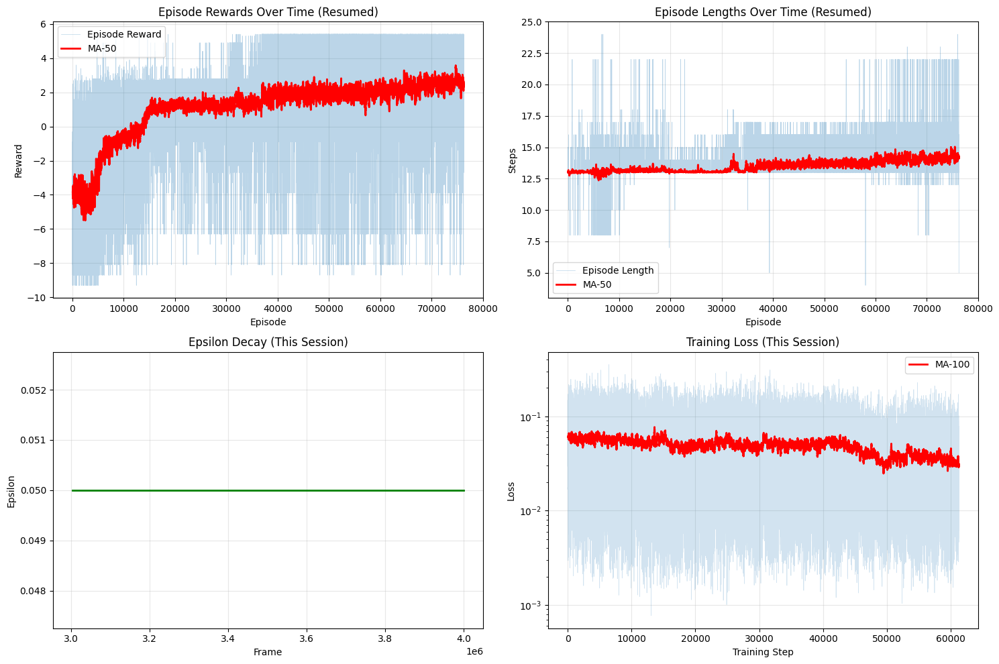


TRAINING SUMMARY
Training mode: RESUME
Total frames: 4,000,000
Total episodes: 76247
Average reward: 1.10 ± 2.53
Best reward: 5.40
Worst reward: -9.30
Last 50 eps avg: 2.59
Last 100 eps avg: 2.51
Avg episode length: 13.5
Final epsilon: 0.050
Training steps: 238,186
Replay buffer: 100,000/100,000

📥 Downloading final model...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✓ Model downloaded!


In [ ]:
# ============================================================================
# CONFIGURATION - EDIT THIS TO CONTROL TRAINING MODE
# ============================================================================
TRAINING_MODE = "resume"  # Options: "fresh" or "resume"
RESUME_CHECKPOINT = "/content/checkpoints/final_model.pth"  # Path to checkpoint for resume mode

# ============================================================================
# IMPORTS
# ============================================================================
import flappy_bird_gymnasium
import gymnasium as gym
import torch
import torch.optim as optim
import numpy as np
from collections import deque
import matplotlib.pyplot as plt
import os

try:
    from tqdm import tqdm
except ImportError:
    !pip install tqdm
    from tqdm import tqdm

# ============================================================================
# HYPERPARAMETERS
# ============================================================================
TOTAL_FRAMES = 4_000_000
REPLAY_BUFFER_SIZE = 100_000
MIN_REPLAY_SIZE = 10_000
BATCH_SIZE = 32
LEARNING_RATE = 0.00025
GAMMA = 0.99
TARGET_UPDATE_FREQ = 2_500
FRAME_SKIP = 4
EPS_START = 1.0
EPS_END = 0.05
EPS_DECAY_FRAMES = 200_000
UPDATE_FREQ = 4
SAVE_FREQ = 50_000
CHECKPOINT_DIR = "/content/checkpoints"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
if device.type == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name(0)}")

os.makedirs(CHECKPOINT_DIR, exist_ok=True)

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================
def save_checkpoint(filepath, q_net, target_net, optimizer, total_steps, episode,
                   episode_rewards, episode_lengths, train_steps=None):
    """Save training checkpoint"""
    checkpoint = {
        'q_net_state_dict': q_net.state_dict(),
        'target_net_state_dict': target_net.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'total_steps': total_steps,
        'episode': episode,
        'episode_rewards': episode_rewards,
        'episode_lengths': episode_lengths,
    }
    if train_steps is not None:
        checkpoint['train_steps'] = train_steps

    torch.save(checkpoint, filepath)
    print(f"✓ Checkpoint saved: {filepath}")

def load_checkpoint(filepath):
    """Load training checkpoint"""
    if not os.path.exists(filepath):
        raise FileNotFoundError(f"Checkpoint not found: {filepath}")

    checkpoint = torch.load(filepath)
    print(f"✓ Checkpoint loaded from: {filepath}")
    print(f"  Total frames: {checkpoint['total_steps']:,}")
    print(f"  Episode: {checkpoint['episode']}")
    print(f"  Avg reward (last 10): {np.mean(checkpoint['episode_rewards'][-10:]):.2f}")

    return checkpoint

def initialize_training_state(mode, checkpoint_path=None):
    """
    Initialize or restore training state based on mode

    Args:
        mode: "fresh" or "resume"
        checkpoint_path: Path to checkpoint (required if mode="resume")

    Returns:
        dict with training state
    """
    if mode == "fresh":
        print("\n" + "="*60)
        print("STARTING FRESH TRAINING")
        print("="*60)

        return {
            'total_steps': 0,
            'episode': 0,
            'episode_rewards': [],
            'episode_lengths': [],
            'losses': [],
            'epsilon_history': [],
            'last_save': 0,
            'q_net_state': None,
            'target_net_state': None,
            'optimizer_state': None,
        }

    elif mode == "resume":
        print("\n" + "="*60)
        print("RESUMING TRAINING FROM CHECKPOINT")
        print("="*60)

        if checkpoint_path is None:
            raise ValueError("checkpoint_path required for resume mode")

        checkpoint = load_checkpoint(checkpoint_path)

        return {
            'total_steps': checkpoint['total_steps'],
            'episode': checkpoint['episode'],
            'episode_rewards': checkpoint['episode_rewards'],
            'episode_lengths': checkpoint['episode_lengths'],
            'losses': [],  # Fresh loss tracking
            'epsilon_history': [],  # Fresh epsilon tracking
            'last_save': checkpoint['total_steps'],
            'q_net_state': checkpoint['q_net_state_dict'],
            'target_net_state': checkpoint['target_net_state_dict'],
            'optimizer_state': checkpoint['optimizer_state_dict'],
            'train_steps': checkpoint.get('train_steps', None),
        }

    else:
        raise ValueError(f"Invalid mode: {mode}. Use 'fresh' or 'resume'")

# ============================================================================
# INITIALIZE ENVIRONMENT AND NETWORKS
# ============================================================================
env = gym.make("FlappyBird-v0", render_mode='rgb_array')
num_actions = env.action_space.n
print(f"Number of actions: {num_actions}")

# Create networks
q_net = DQN(num_actions).to(device)
target_net = DQN(num_actions).to(device)
target_net.eval()

# Create components
replay_buffer = ReplayBuffer(REPLAY_BUFFER_SIZE)
frame_buffer = FrameBuffer()
trainer = DQNTrainer(
    q_net=q_net,
    target_net=target_net,
    replay_buffer=replay_buffer,
    gamma=GAMMA,
    lr=LEARNING_RATE,
    batch_size=BATCH_SIZE,
    target_update_freq=TARGET_UPDATE_FREQ,
    device=device
)
agent = DQNAgent(
    q_net=q_net,
    num_actions=num_actions,
    eps_start=EPS_START,
    eps_end=EPS_END,
    eps_decay_steps=EPS_DECAY_FRAMES
)

# ============================================================================
# INITIALIZE OR RESTORE TRAINING STATE
# ============================================================================
state = initialize_training_state(
    mode=TRAINING_MODE,
    checkpoint_path=RESUME_CHECKPOINT if TRAINING_MODE == "resume" else None
)

# Extract state variables
total_steps = state['total_steps']
episode = state['episode']
episode_rewards = state['episode_rewards']
episode_lengths = state['episode_lengths']
losses = state['losses']
epsilon_history = state['epsilon_history']
last_save = state['last_save']

# Load network states if resuming
if state['q_net_state'] is not None:
    q_net.load_state_dict(state['q_net_state'])
    target_net.load_state_dict(state['target_net_state'])
    trainer.optimizer.load_state_dict(state['optimizer_state'])
    agent.steps_done = total_steps

    # Restore trainer steps
    if state.get('train_steps') is not None:
        trainer.train_steps = state['train_steps']
    else:
        trainer.train_steps = max(0, (total_steps - MIN_REPLAY_SIZE) // UPDATE_FREQ)

    print(f"  Agent steps: {agent.steps_done:,}")
    print(f"  Trainer steps: {trainer.train_steps:,}")
else:
    # Fresh training - initialize target net
    target_net.load_state_dict(q_net.state_dict())

print(f"\nTarget: {TOTAL_FRAMES:,} frames")
print(f"Starting from: {total_steps:,} frames")
print(f"Remaining: {TOTAL_FRAMES - total_steps:,} frames")
print("="*60 + "\n")

# ============================================================================
# TRAINING LOOP
# ============================================================================
print(f"Starting training...")
print(f"Expected time: ~1-2 hours on T4 GPU")
print(f"Training will start after {MIN_REPLAY_SIZE:,} frames\n")

pbar = tqdm(total=TOTAL_FRAMES, initial=total_steps, desc="Training")

try:
    while total_steps < TOTAL_FRAMES:
        # Reset environment
        observation, info = env.reset()
        frame_buffer.reset()

        # Get initial frames
        prev_frame = env.render()
        curr_frame = env.render()

        # Initialize buffer with first frame
        first_preprocessed = preprocess(prev_frame, curr_frame)
        state_array = frame_buffer.add_frame(first_preprocessed)

        episode_reward = 0
        episode_length = 0
        done = False

        while not done and total_steps < TOTAL_FRAMES:
            # Select action
            state_tensor = torch.FloatTensor(state_array).to(device)
            action = agent.act(state_tensor, device=device)

            # Execute action with frame skipping
            frame_reward = 0
            for _ in range(FRAME_SKIP):
                observation, reward, terminated, truncated, info = env.step(action)
                frame_reward += reward
                total_steps += 1

                # Check if we've hit the target
                if total_steps >= TOTAL_FRAMES:
                    done = True
                    break

                if terminated or truncated:
                    done = True
                    break

            # Get next state
            curr_frame = env.render()
            preprocessed = preprocess(prev_frame, curr_frame)
            next_state = frame_buffer.add_frame(preprocessed)

            # Store transition
            replay_buffer.push(state_array, action, frame_reward, next_state, done)

            # Train
            if len(replay_buffer) >= MIN_REPLAY_SIZE and total_steps % UPDATE_FREQ == 0:
                loss = trainer.train_step()
                if loss is not None:
                    losses.append(loss)

            # Save checkpoint periodically
            if total_steps - last_save >= SAVE_FREQ:
                checkpoint_path = f"{CHECKPOINT_DIR}/checkpoint_{total_steps}.pth"
                save_checkpoint(
                    checkpoint_path, q_net, target_net, trainer.optimizer,
                    total_steps, episode, episode_rewards, episode_lengths,
                    train_steps=trainer.train_steps
                )
                last_save = total_steps

            # Update state
            state_array = next_state
            prev_frame = curr_frame
            episode_reward += frame_reward
            episode_length += 1

            # Update progress bar
            pbar.update(FRAME_SKIP)

            # Record epsilon
            if total_steps % 1000 == 0:
                epsilon_history.append((total_steps, agent.epsilon()))

        # Episode ended
        episode += 1
        episode_rewards.append(episode_reward)
        episode_lengths.append(episode_length)

        # Print progress
        if episode % 10 == 0:
            avg_reward = np.mean(episode_rewards[-10:]) if len(episode_rewards) >= 10 else np.mean(episode_rewards)
            avg_length = np.mean(episode_lengths[-10:]) if len(episode_lengths) >= 10 else np.mean(episode_lengths)
            avg_loss = np.mean(losses[-100:]) if len(losses) >= 100 else (np.mean(losses) if losses else 0)

            pbar.set_postfix({
                'Ep': episode,
                'Reward': f'{avg_reward:.1f}',
                'ε': f'{agent.epsilon():.3f}',
                'Loss': f'{avg_loss:.4f}'
            })

except KeyboardInterrupt:
    print("\n⚠️ Training interrupted by user")

finally:
    pbar.close()
    env.close()

    # Save final checkpoint
    final_path = f"{CHECKPOINT_DIR}/final_model.pth"
    save_checkpoint(
        final_path, q_net, target_net, trainer.optimizer,
        total_steps, episode, episode_rewards, episode_lengths,
        train_steps=trainer.train_steps
    )

    print("\n✓ Training completed!")
    print(f"Total frames: {total_steps:,}")
    print(f"Total episodes: {episode}")

# ============================================================================
# VISUALIZATION
# ============================================================================
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Episode Rewards
axes[0, 0].plot(episode_rewards, alpha=0.3, label='Episode Reward', linewidth=0.5)
if len(episode_rewards) >= 50:
    window = min(50, len(episode_rewards))
    moving_avg = np.convolve(episode_rewards, np.ones(window)/window, mode='valid')
    axes[0, 0].plot(range(window-1, len(episode_rewards)), moving_avg,
                    'r-', linewidth=2, label=f'MA-{window}')
axes[0, 0].set_xlabel('Episode')
axes[0, 0].set_ylabel('Reward')
title_suffix = " (Resumed)" if TRAINING_MODE == "resume" else ""
axes[0, 0].set_title(f'Episode Rewards Over Time{title_suffix}')
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Episode Lengths
axes[0, 1].plot(episode_lengths, alpha=0.3, label='Episode Length', linewidth=0.5)
if len(episode_lengths) >= 50:
    window = min(50, len(episode_lengths))
    moving_avg = np.convolve(episode_lengths, np.ones(window)/window, mode='valid')
    axes[0, 1].plot(range(window-1, len(episode_lengths)), moving_avg,
                    'r-', linewidth=2, label=f'MA-{window}')
axes[0, 1].set_xlabel('Episode')
axes[0, 1].set_ylabel('Steps')
axes[0, 1].set_title(f'Episode Lengths Over Time{title_suffix}')
axes[0, 1].legend()
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: Epsilon Decay
if epsilon_history:
    steps, eps_values = zip(*epsilon_history)
    axes[1, 0].plot(steps, eps_values, 'g-', linewidth=2)
    axes[1, 0].set_xlabel('Frame')
    axes[1, 0].set_ylabel('Epsilon')
    title = 'Epsilon Decay (This Session)' if TRAINING_MODE == "resume" else 'Epsilon Decay'
    axes[1, 0].set_title(title)
    axes[1, 0].grid(True, alpha=0.3)
else:
    axes[1, 0].text(0.5, 0.5, 'No epsilon data\n(resumed from checkpoint)',
                    ha='center', va='center', transform=axes[1, 0].transAxes)
    axes[1, 0].set_title('Epsilon Decay')

# Plot 4: Training Loss
if losses:
    axes[1, 1].plot(losses, alpha=0.2, linewidth=0.5)
    if len(losses) >= 100:
        window = 100
        moving_avg = np.convolve(losses, np.ones(window)/window, mode='valid')
        axes[1, 1].plot(range(window-1, len(losses)), moving_avg,
                       'r-', linewidth=2, label=f'MA-{window}')
    axes[1, 1].set_xlabel('Training Step')
    axes[1, 1].set_ylabel('Loss')
    title = 'Training Loss (This Session)' if TRAINING_MODE == "resume" else 'Training Loss'
    axes[1, 1].set_title(title)
    axes[1, 1].set_yscale('log')
    axes[1, 1].legend()
    axes[1, 1].grid(True, alpha=0.3)
else:
    axes[1, 1].text(0.5, 0.5, 'No loss data yet',
                    ha='center', va='center', transform=axes[1, 1].transAxes)
    axes[1, 1].set_title('Training Loss')

plt.tight_layout()
save_name = 'training_results_resumed.png' if TRAINING_MODE == "resume" else 'training_results.png'
plt.savefig(f'/content/{save_name}', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# SUMMARY
# ============================================================================
print("\n" + "="*60)
print("TRAINING SUMMARY")
print("="*60)
print(f"Training mode: {TRAINING_MODE.upper()}")
print(f"Total frames: {total_steps:,}")
print(f"Total episodes: {episode}")
print(f"Average reward: {np.mean(episode_rewards):.2f} ± {np.std(episode_rewards):.2f}")
print(f"Best reward: {np.max(episode_rewards):.2f}")
print(f"Worst reward: {np.min(episode_rewards):.2f}")
print(f"Last 50 eps avg: {np.mean(episode_rewards[-50:]):.2f}" if len(episode_rewards) >= 50 else "N/A")
print(f"Last 100 eps avg: {np.mean(episode_rewards[-100:]):.2f}" if len(episode_rewards) >= 100 else "N/A")
print(f"Avg episode length: {np.mean(episode_lengths):.1f}")
print(f"Final epsilon: {agent.epsilon():.3f}")
print(f"Training steps: {trainer.train_steps:,}")
print(f"Replay buffer: {len(replay_buffer):,}/{REPLAY_BUFFER_SIZE:,}")
print("="*60)

# Download model
from google.colab import files
print("\n📥 Downloading final model...")
files.download(final_path)
print("✓ Model downloaded!")

# State-based DQN

In [ ]:
!pip install flappy_bird_gymnasium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 51.7 MB/s eta 0:00:00


In [ ]:
import gymnasium as gym

In [ ]:
import flappy_bird_gymnasium
import inspect

env = gym.make("FlappyBird-v0", use_lidar=False)
obs, _ = env.reset()

# Check if environment has state names defined
if hasattr(env.unwrapped, '_get_observation'):
    print("Found _get_observation method")
    print(inspect.getsource(env.unwrapped._get_observation_features))

# Check environment attributes
print("\nEnvironment attributes:")
for attr in dir(env.unwrapped):
    if 'state' in attr.lower() or 'obs' in attr.lower():
        print(f"  - {attr}")

print(f"Observation shape: {obs.shape}")
print(f"Number of actions: {env.action_space.n}")
print(f"First few values: {obs[:20]}")

Found _get_observation method
    def _get_observation_features(self) -> np.ndarray:
        pipes = []
        for up_pipe, low_pipe in zip(self._upper_pipes, self._lower_pipes):
            # the pipe is behind the screen?
            if low_pipe["x"] > self._screen_width:
                pipes.append((self._screen_width, 0, self._screen_height))
            else:
                pipes.append(
                    (low_pipe["x"], (up_pipe["y"] + PIPE_HEIGHT), low_pipe["y"])
                )

        pipes = sorted(pipes, key=lambda x: x[0])
        pos_y = self._player_y
        vel_y = self._player_vel_y
        rot = self._player_rot

        if self._normalize_obs:
            pipes = [
                (
                    h / self._screen_width,
                    v1 / self._screen_height,
                    v2 / self._screen_height,
                )
                for h, v1, v2 in pipes
            ]
            pos_y /= self._screen_height
            vel_y /= PLAYER_MAX_V

In [ ]:
import flappy_bird_gymnasium
import gymnasium as gym
import torch
import random
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
from collections import deque
import os

try:
    from tqdm import tqdm
except ImportError:
    !pip install tqdm
    from tqdm import tqdm

# ============================================================================
# CONFIGURATION
# ============================================================================
TRAINING_MODE = "resume"
RESUME_CHECKPOINT = None

# ============================================================================
# HYPERPARAMETERS
# ============================================================================
TOTAL_FRAMES = 5_000_000
REPLAY_BUFFER_SIZE = 100_000
MIN_REPLAY_SIZE = 10_000
BATCH_SIZE = 32
LEARNING_RATE = 0.00025
GAMMA = 0.99
TARGET_UPDATE_FREQ = 10_000
FRAME_SKIP = 4
EPS_START = 1.0
EPS_END = 0.05
EPS_DECAY_FRAMES = 200_000
UPDATE_FREQ = 4
SAVE_FREQ = 50_000
CHECKPOINT_DIR = "/content/checkpoints"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

os.makedirs(CHECKPOINT_DIR, exist_ok=True)

# ============================================================================
# STATE-BASED DQN NETWORK (Simple Fully Connected)
# ============================================================================
class StateDQN(nn.Module):
    def __init__(self, state_dim, num_actions, hidden_dim=256):
        super().__init__()

        self.network = nn.Sequential(
            nn.Linear(state_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, num_actions)
        )

    def forward(self, x):
        return self.network(x)

# ============================================================================
# Simple Replay Buffer (No Image Preprocessing Needed)
# ============================================================================
class SimpleReplayBuffer:
    def __init__(self, capacity):
        self.buffer = deque(maxlen=capacity)

    def push(self, state, action, reward, next_state, done):
        # Clip the reward: positive values turn into 1 and negative values turn into 0
        clipped_reward = np.sign(reward)
        self.buffer.append((state, action, clipped_reward, next_state, done))

    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        state, action, reward, next_state, done = zip(*batch)
        return state, action, reward, next_state, done

    def __len__(self):
        return len(self.buffer)

# ============================================================================
# DQN Agent (No Frame Stacking)
# ============================================================================
class StateDQNAgent:
    def __init__(self, q_net, num_actions, eps_start=1.0, eps_end=0.1,
                 eps_decay_steps=1_000_000):
        self.q_net = q_net
        self.num_actions = num_actions
        self.eps_start = eps_start
        self.eps_end = eps_end
        self.eps_decay_steps = eps_decay_steps
        self.steps_done = 0

    def epsilon(self):
        frac = min(self.steps_done / self.eps_decay_steps, 1.0)
        return self.eps_start + frac * (self.eps_end - self.eps_start)

    def act(self, state, device='cpu'):
        self.steps_done += 1

        if np.random.rand() < self.epsilon():
            return np.random.randint(self.num_actions)

        with torch.no_grad():
            # State is already a vector, just convert to tensor
            if not isinstance(state, torch.Tensor):
                state = torch.FloatTensor(state)

            if state.dim() == 1:
                state = state.unsqueeze(0)

            state = state.to(device)
            q_values = self.q_net(state)
            return q_values.argmax(dim=1).item()

# ============================================================================
# DQN Trainer
# ============================================================================
class StateDQNTrainer:
    def __init__(self, q_net, target_net, replay_buffer, gamma=0.99,
                 lr=0.00025, batch_size=32, target_update_freq=10_000,
                 device='cuda'):
        self.device = device
        self.q_net = q_net.to(device)
        self.target_net = target_net.to(device)
        self.target_net.load_state_dict(self.q_net.state_dict())
        self.target_net.eval()

        self.buffer = replay_buffer
        self.gamma = gamma
        self.batch_size = batch_size
        self.target_update_freq = target_update_freq

        self.optimizer = optim.Adam(q_net.parameters(), lr=lr)
        self.loss_fn = nn.SmoothL1Loss()
        self.train_steps = 0

    def train_step(self):
        if len(self.buffer) < self.batch_size:
            return None

        state, action, reward, next_state, done = self.buffer.sample(self.batch_size)

        # Convert to tensors (states are already clean vectors)
        state = torch.FloatTensor(np.array(state)).to(self.device)
        next_state = torch.FloatTensor(np.array(next_state)).to(self.device)
        action = torch.LongTensor(action).to(self.device)
        reward = torch.FloatTensor(reward).to(self.device)
        done = torch.FloatTensor(done).to(self.device)

        # Current Q values
        q_values = self.q_net(state)
        q_sa = q_values.gather(1, action.unsqueeze(1)).squeeze(1)

        # Target Q values
        with torch.no_grad():
            next_q = self.target_net(next_state).max(1)[0]
            target = reward + self.gamma * next_q * (1 - done)

        # Compute loss
        loss = self.loss_fn(q_sa, target)

        # Optimize
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        # Update target network
        self.train_steps += 1
        if self.train_steps % self.target_update_freq == 0:
            self.target_net.load_state_dict(self.q_net.state_dict())

        return loss.item()

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================
def save_checkpoint(filepath, q_net, target_net, optimizer, total_steps, episode,
                   episode_rewards, episode_lengths, train_steps=None):
    checkpoint = {
        'q_net_state_dict': q_net.state_dict(),
        'target_net_state_dict': target_net.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'total_steps': total_steps,
        'episode': episode,
        'episode_rewards': episode_rewards,
        'episode_lengths': episode_lengths,
    }
    if train_steps is not None:
        checkpoint['train_steps'] = train_steps

    torch.save(checkpoint, filepath)
    print(f"✓ Checkpoint saved: {filepath}")

# ============================================================================
# MODIFIED: INITIALIZE ENVIRONMENT (State-Based)
# ============================================================================
env = gym.make("FlappyBird-v0", use_lidar=False)
num_actions = env.action_space.n
state_dim = env.observation_space.shape[0]  # Should be 12

print(f"State dimension: {state_dim}")
print(f"Number of actions: {num_actions}")

# Create networks
q_net = StateDQN(state_dim, num_actions, hidden_dim=256).to(device)
target_net = StateDQN(state_dim, num_actions, hidden_dim=256).to(device)
target_net.load_state_dict(q_net.state_dict())
target_net.eval()

# Create components
replay_buffer = SimpleReplayBuffer(REPLAY_BUFFER_SIZE)
trainer = StateDQNTrainer(
    q_net=q_net,
    target_net=target_net,
    replay_buffer=replay_buffer,
    gamma=GAMMA,
    lr=LEARNING_RATE,
    batch_size=BATCH_SIZE,
    target_update_freq=TARGET_UPDATE_FREQ,
    device=device
)
agent = StateDQNAgent(
    q_net=q_net,
    num_actions=num_actions,
    eps_start=EPS_START,
    eps_end=EPS_END,
    eps_decay_steps=EPS_DECAY_FRAMES
)

# ============================================================================
# TRAINING LOOP
# ============================================================================
episode_rewards = []
episode_lengths = []
losses = []
epsilon_history = []

total_steps = 0
episode = 0
last_save = 0

print(f"\nStarting training for {TOTAL_FRAMES:,} frames...")
print(f"Training will start after {MIN_REPLAY_SIZE:,} frames\n")

pbar = tqdm(total=TOTAL_FRAMES, desc="Training")

try:
    while total_steps < TOTAL_FRAMES:
        # Reset environment
        state, info = env.reset()  # State is already a clean vector!

        episode_reward = 0
        episode_length = 0
        done = False

        while not done and total_steps < TOTAL_FRAMES:
            # Select action (no preprocessing needed!)
            action = agent.act(state, device=device)

            # Execute action with frame skipping
            frame_reward = 0
            for _ in range(FRAME_SKIP):
                next_state, reward, terminated, truncated, info = env.step(action)
                frame_reward += reward
                total_steps += 1

                if total_steps >= TOTAL_FRAMES:
                    done = True
                    break

                if terminated or truncated:
                    done = True
                    break

            # Store transition (states are already vectors!)
            replay_buffer.push(state, action, frame_reward, next_state, done)

            # Train
            if len(replay_buffer) >= MIN_REPLAY_SIZE and total_steps % UPDATE_FREQ == 0:
                loss = trainer.train_step()
                if loss is not None:
                    losses.append(loss)

            # Save checkpoint periodically
            if total_steps - last_save >= SAVE_FREQ:
                checkpoint_path = f"{CHECKPOINT_DIR}/checkpoint_{total_steps}.pth"
                save_checkpoint(
                    checkpoint_path, q_net, target_net, trainer.optimizer,
                    total_steps, episode, episode_rewards, episode_lengths,
                    train_steps=trainer.train_steps
                )
                last_save = total_steps

            # Update state
            state = next_state
            episode_reward += frame_reward
            episode_length += 1

            # Update progress bar
            pbar.update(FRAME_SKIP)

            # Record epsilon
            if total_steps % 1000 == 0:
                epsilon_history.append((total_steps, agent.epsilon()))

        # Episode ended
        episode += 1
        episode_rewards.append(episode_reward)
        episode_lengths.append(episode_length)

        # Print progress
        if episode % 10 == 0:
            avg_reward = np.mean(episode_rewards[-10:]) if len(episode_rewards) >= 10 else np.mean(episode_rewards)
            avg_length = np.mean(episode_lengths[-10:]) if len(episode_lengths) >= 10 else np.mean(episode_lengths)
            avg_loss = np.mean(losses[-100:]) if len(losses) >= 100 else (np.mean(losses) if losses else 0)

            pbar.set_postfix({
                'Ep': episode,
                'Reward': f'{avg_reward:.1f}',
                'ε': f'{agent.epsilon():.3f}',
                'Loss': f'{avg_loss:.4f}'
            })

except KeyboardInterrupt:
    print("\n⚠️ Training interrupted by user")

finally:
    pbar.close()
    env.close()

    # Save final checkpoint
    final_path = f"{CHECKPOINT_DIR}/final_model_state_based.pth"
    save_checkpoint(
        final_path, q_net, target_net, trainer.optimizer,
        total_steps, episode, episode_rewards, episode_lengths,
        train_steps=trainer.train_steps
    )

    print("\n✓ Training completed!")
    print(f"Total frames: {total_steps:,}")
    print(f"Total episodes: {episode}")

Using device: cuda
State dimension: 12
Number of actions: 2

Starting training for 5,000,000 frames...
Training will start after 10,000 frames



Training:   1%|          | 52604/5000000 [00:03<11:52, 6939.22it/s, Ep=1010, Reward=-3.7, ε=0.938, Loss=0.0661]

✓ Checkpoint saved: /content/checkpoints/checkpoint_50002.pth


Training:   2%|▏         | 108840/5000000 [00:13<08:51, 9194.15it/s, Ep=2090, Reward=-2.9, ε=0.871, Loss=0.0344]

✓ Checkpoint saved: /content/checkpoints/checkpoint_100002.pth


Training:   3%|▎         | 156396/5000000 [00:26<26:27, 3050.87it/s, Ep=3000, Reward=-3.1, ε=0.814, Loss=0.0217]

✓ Checkpoint saved: /content/checkpoints/checkpoint_150004.pth


Training:   4%|▍         | 212264/5000000 [00:34<06:30, 12249.45it/s, Ep=4070, Reward=-3.4, ε=0.748, Loss=0.0313]

✓ Checkpoint saved: /content/checkpoints/checkpoint_200005.pth


Training:   5%|▌         | 260268/5000000 [00:45<26:53, 2937.14it/s, Ep=4990, Reward=-0.0, ε=0.691, Loss=0.0247]

✓ Checkpoint saved: /content/checkpoints/checkpoint_250008.pth


Training:   6%|▌         | 312220/5000000 [00:54<13:06, 5958.92it/s, Ep=5980, Reward=0.0, ε=0.629, Loss=0.0203] 

✓ Checkpoint saved: /content/checkpoints/checkpoint_300009.pth


Training:   7%|▋         | 364196/5000000 [01:04<12:28, 6192.42it/s, Ep=6970, Reward=-0.7, ε=0.568, Loss=0.0264]

✓ Checkpoint saved: /content/checkpoints/checkpoint_350012.pth


Training:   8%|▊         | 416404/5000000 [01:18<17:33, 4352.65it/s, Ep=7960, Reward=-0.1, ε=0.506, Loss=0.0191]

✓ Checkpoint saved: /content/checkpoints/checkpoint_400013.pth


Training:   9%|▉         | 470348/5000000 [01:30<09:08, 8258.46it/s, Ep=8980, Reward=0.8, ε=0.441, Loss=0.0189]

✓ Checkpoint saved: /content/checkpoints/checkpoint_450013.pth


Training:  10%|█         | 520080/5000000 [01:41<17:23, 4293.39it/s, Ep=9900, Reward=1.6, ε=0.383, Loss=0.0258]

✓ Checkpoint saved: /content/checkpoints/checkpoint_500016.pth


Training:  11%|█▏        | 571608/5000000 [01:53<19:24, 3802.47it/s, Ep=10850, Reward=0.7, ε=0.322, Loss=0.0295]

✓ Checkpoint saved: /content/checkpoints/checkpoint_550019.pth


Training:  12%|█▏        | 623820/5000000 [02:05<11:40, 6247.39it/s, Ep=11790, Reward=2.1, ε=0.259, Loss=0.0332]

✓ Checkpoint saved: /content/checkpoints/checkpoint_600020.pth


Training:  14%|█▎        | 675240/5000000 [02:16<13:59, 5150.56it/s, Ep=12700, Reward=4.3, ε=0.198, Loss=0.0545]

✓ Checkpoint saved: /content/checkpoints/checkpoint_650021.pth


Training:  15%|█▍        | 727040/5000000 [02:29<13:40, 5210.12it/s, Ep=13590, Reward=0.9, ε=0.137, Loss=0.0584]

✓ Checkpoint saved: /content/checkpoints/checkpoint_700023.pth


Training:  16%|█▌        | 777780/5000000 [02:41<23:18, 3018.86it/s, Ep=14440, Reward=5.2, ε=0.076, Loss=0.0569]

✓ Checkpoint saved: /content/checkpoints/checkpoint_750023.pth


Training:  17%|█▋        | 828644/5000000 [02:56<24:57, 2786.07it/s, Ep=15280, Reward=4.1, ε=0.050, Loss=0.0582]

✓ Checkpoint saved: /content/checkpoints/checkpoint_800026.pth


Training:  18%|█▊        | 879888/5000000 [03:08<19:35, 3505.11it/s, Ep=16130, Reward=4.9, ε=0.050, Loss=0.0842]

✓ Checkpoint saved: /content/checkpoints/checkpoint_850028.pth


Training:  19%|█▊        | 931056/5000000 [03:22<16:22, 4142.30it/s, Ep=16950, Reward=5.3, ε=0.050, Loss=0.0713]

✓ Checkpoint saved: /content/checkpoints/checkpoint_900031.pth


Training:  20%|█▉        | 982072/5000000 [03:35<12:10, 5497.16it/s, Ep=17740, Reward=5.1, ε=0.050, Loss=0.0739]

✓ Checkpoint saved: /content/checkpoints/checkpoint_950032.pth


Training:  21%|██        | 1033136/5000000 [03:48<20:11, 3275.37it/s, Ep=18530, Reward=6.4, ε=0.050, Loss=0.0949]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1000033.pth


Training:  22%|██▏       | 1084516/5000000 [04:01<19:58, 3268.12it/s, Ep=19330, Reward=5.6, ε=0.050, Loss=0.1114]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1050036.pth


Training:  23%|██▎       | 1135748/5000000 [04:14<16:26, 3919.11it/s, Ep=20110, Reward=6.3, ε=0.050, Loss=0.0895]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1100038.pth


Training:  24%|██▎       | 1186044/5000000 [04:26<22:43, 2797.42it/s, Ep=20880, Reward=5.8, ε=0.050, Loss=0.1121]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1150041.pth


Training:  25%|██▍       | 1237212/5000000 [04:40<13:52, 4520.15it/s, Ep=21640, Reward=6.5, ε=0.050, Loss=0.1111]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1200044.pth


Training:  26%|██▌       | 1287984/5000000 [04:53<16:19, 3789.39it/s, Ep=22380, Reward=6.5, ε=0.050, Loss=0.1039]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1250044.pth


Training:  27%|██▋       | 1338772/5000000 [05:06<10:57, 5565.66it/s, Ep=23120, Reward=6.0, ε=0.050, Loss=0.1492]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1300047.pth


Training:  28%|██▊       | 1390112/5000000 [05:19<15:31, 3873.87it/s, Ep=23860, Reward=6.9, ε=0.050, Loss=0.1318]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1350049.pth


Training:  29%|██▉       | 1441252/5000000 [05:32<14:54, 3979.27it/s, Ep=24610, Reward=6.1, ε=0.050, Loss=0.1308]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1400052.pth


Training:  30%|██▉       | 1492736/5000000 [05:46<12:39, 4616.76it/s, Ep=25350, Reward=4.9, ε=0.050, Loss=0.1214]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1450052.pth


Training:  31%|███       | 1543480/5000000 [05:58<14:38, 3935.12it/s, Ep=26080, Reward=6.0, ε=0.050, Loss=0.1445]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1500052.pth


Training:  32%|███▏      | 1594924/5000000 [06:12<15:44, 3607.00it/s, Ep=26820, Reward=7.0, ε=0.050, Loss=0.1778]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1550052.pth


Training:  33%|███▎      | 1646684/5000000 [06:26<10:17, 5426.29it/s, Ep=27590, Reward=5.4, ε=0.050, Loss=0.1721]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1600053.pth


Training:  34%|███▍      | 1697664/5000000 [06:38<16:33, 3324.97it/s, Ep=28360, Reward=6.0, ε=0.050, Loss=0.2132]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1650056.pth


Training:  35%|███▍      | 1748592/5000000 [06:50<14:23, 3767.03it/s, Ep=29100, Reward=6.7, ε=0.050, Loss=0.1849]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1700058.pth


Training:  36%|███▌      | 1801092/5000000 [07:04<08:52, 6010.81it/s, Ep=29900, Reward=4.8, ε=0.050, Loss=0.1943]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1750061.pth


Training:  37%|███▋      | 1851140/5000000 [07:17<15:30, 3385.29it/s, Ep=30680, Reward=5.8, ε=0.050, Loss=0.2128]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1800064.pth


Training:  38%|███▊      | 1902516/5000000 [07:30<12:58, 3979.64it/s, Ep=31470, Reward=4.9, ε=0.050, Loss=0.1929]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1850066.pth


Training:  39%|███▉      | 1954420/5000000 [07:43<12:06, 4193.08it/s, Ep=32310, Reward=4.9, ε=0.050, Loss=0.1593]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1900069.pth


Training:  40%|████      | 2006112/5000000 [07:56<11:31, 4330.41it/s, Ep=33150, Reward=6.9, ε=0.050, Loss=0.1415]

✓ Checkpoint saved: /content/checkpoints/checkpoint_1950072.pth


Training:  41%|████      | 2056240/5000000 [08:08<15:39, 3133.28it/s, Ep=33880, Reward=6.5, ε=0.050, Loss=0.1597]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2000075.pth


Training:  42%|████▏     | 2106976/5000000 [08:21<13:21, 3610.84it/s, Ep=34580, Reward=6.8, ε=0.050, Loss=0.1847]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2050077.pth


Training:  43%|████▎     | 2159384/5000000 [08:35<06:43, 7039.44it/s, Ep=35290, Reward=8.7, ε=0.050, Loss=0.1703]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2100079.pth


Training:  44%|████▍     | 2210012/5000000 [08:49<08:43, 5333.09it/s, Ep=35970, Reward=7.6, ε=0.050, Loss=0.1809]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2150082.pth


Training:  45%|████▌     | 2259856/5000000 [09:00<11:34, 3948.21it/s, Ep=36660, Reward=8.0, ε=0.050, Loss=0.1709]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2200083.pth


Training:  46%|████▌     | 2310688/5000000 [09:14<11:23, 3934.25it/s, Ep=37360, Reward=8.0, ε=0.050, Loss=0.1681]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2250084.pth


Training:  47%|████▋     | 2361724/5000000 [09:27<12:16, 3583.62it/s, Ep=38070, Reward=5.9, ε=0.050, Loss=0.2079]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2300084.pth


Training:  48%|████▊     | 2413228/5000000 [09:40<10:04, 4279.13it/s, Ep=38760, Reward=7.3, ε=0.050, Loss=0.1603]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2350087.pth


Training:  49%|████▉     | 2463572/5000000 [09:53<10:29, 4032.20it/s, Ep=39410, Reward=6.9, ε=0.050, Loss=0.1448]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2400089.pth


Training:  50%|█████     | 2514048/5000000 [10:06<12:05, 3424.45it/s, Ep=40070, Reward=7.2, ε=0.050, Loss=0.1551]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2450089.pth


Training:  51%|█████▏    | 2565412/5000000 [10:19<06:56, 5849.73it/s, Ep=40730, Reward=7.6, ε=0.050, Loss=0.1438]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2500091.pth


Training:  52%|█████▏    | 2616264/5000000 [10:33<07:16, 5457.25it/s, Ep=41380, Reward=6.9, ε=0.050, Loss=0.1720]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2550092.pth


Training:  53%|█████▎    | 2666156/5000000 [10:47<13:33, 2867.36it/s, Ep=42020, Reward=6.7, ε=0.050, Loss=0.1525]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2600093.pth


Training:  54%|█████▍    | 2717184/5000000 [11:00<13:25, 2835.51it/s, Ep=42670, Reward=7.6, ε=0.050, Loss=0.1661]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2650094.pth


Training:  55%|█████▌    | 2768080/5000000 [11:13<12:22, 3007.67it/s, Ep=43310, Reward=7.5, ε=0.050, Loss=0.1655]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2700096.pth


Training:  56%|█████▋    | 2819656/5000000 [11:27<07:36, 4775.43it/s, Ep=43970, Reward=7.5, ε=0.050, Loss=0.1312]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2750099.pth


Training:  57%|█████▋    | 2870124/5000000 [11:40<07:41, 4614.41it/s, Ep=44610, Reward=8.0, ε=0.050, Loss=0.1621]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2800100.pth


Training:  58%|█████▊    | 2920800/5000000 [11:53<08:19, 4161.82it/s, Ep=45240, Reward=9.0, ε=0.050, Loss=0.1317]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2850101.pth


Training:  59%|█████▉    | 2971836/5000000 [12:06<09:49, 3437.94it/s, Ep=45870, Reward=6.7, ε=0.050, Loss=0.1213]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2900102.pth


Training:  60%|██████    | 3022708/5000000 [12:20<09:36, 3428.44it/s, Ep=46500, Reward=8.3, ε=0.050, Loss=0.1461]

✓ Checkpoint saved: /content/checkpoints/checkpoint_2950104.pth


Training:  61%|██████▏   | 3074048/5000000 [12:33<05:48, 5525.07it/s, Ep=47140, Reward=5.9, ε=0.050, Loss=0.1450]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3000105.pth


Training:  62%|██████▏   | 3124512/5000000 [12:47<07:13, 4329.04it/s, Ep=47770, Reward=8.5, ε=0.050, Loss=0.1504]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3050105.pth


Training:  64%|██████▎   | 3175304/5000000 [13:00<08:44, 3480.13it/s, Ep=48410, Reward=6.9, ε=0.050, Loss=0.1686]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3100108.pth


Training:  65%|██████▍   | 3225872/5000000 [13:13<05:44, 5153.01it/s, Ep=49040, Reward=7.7, ε=0.050, Loss=0.1510]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3150108.pth


Training:  66%|██████▌   | 3276768/5000000 [13:26<09:34, 2999.93it/s, Ep=49670, Reward=7.1, ε=0.050, Loss=0.1501]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3200110.pth


Training:  67%|██████▋   | 3328728/5000000 [13:40<06:17, 4432.36it/s, Ep=50320, Reward=6.7, ε=0.050, Loss=0.1470]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3250111.pth


Training:  68%|██████▊   | 3379352/5000000 [13:53<06:09, 4382.94it/s, Ep=50920, Reward=7.3, ε=0.050, Loss=0.1640]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3300111.pth


Training:  69%|██████▊   | 3429824/5000000 [14:06<09:00, 2905.28it/s, Ep=51530, Reward=8.2, ε=0.050, Loss=0.1428]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3350112.pth


Training:  70%|██████▉   | 3480584/5000000 [14:20<07:52, 3214.18it/s, Ep=52140, Reward=8.6, ε=0.050, Loss=0.1430]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3400113.pth


Training:  71%|███████   | 3531568/5000000 [14:33<07:51, 3111.30it/s, Ep=52750, Reward=7.5, ε=0.050, Loss=0.1824]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3450113.pth


Training:  72%|███████▏  | 3582216/5000000 [14:47<07:43, 3059.56it/s, Ep=53360, Reward=6.8, ε=0.050, Loss=0.1413]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3500116.pth


Training:  73%|███████▎  | 3633268/5000000 [15:01<06:14, 3653.43it/s, Ep=53990, Reward=6.3, ε=0.050, Loss=0.1342]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3550118.pth


Training:  74%|███████▎  | 3684160/5000000 [15:15<05:39, 3879.78it/s, Ep=54620, Reward=6.8, ε=0.050, Loss=0.1867]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3600119.pth


Training:  75%|███████▍  | 3735380/5000000 [15:29<05:25, 3890.40it/s, Ep=55250, Reward=7.0, ε=0.050, Loss=0.1696]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3650122.pth


Training:  76%|███████▌  | 3785648/5000000 [15:41<05:23, 3752.77it/s, Ep=55880, Reward=8.3, ε=0.050, Loss=0.1610]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3700124.pth


Training:  77%|███████▋  | 3836892/5000000 [15:55<04:11, 4624.80it/s, Ep=56530, Reward=5.9, ε=0.050, Loss=0.1996]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3750127.pth


Training:  78%|███████▊  | 3887488/5000000 [16:07<04:46, 3889.73it/s, Ep=57190, Reward=6.0, ε=0.050, Loss=0.1794]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3800130.pth


Training:  79%|███████▉  | 3938956/5000000 [16:21<05:18, 3332.01it/s, Ep=57840, Reward=7.1, ε=0.050, Loss=0.2121]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3850131.pth


Training:  80%|███████▉  | 3990272/5000000 [16:34<04:34, 3681.18it/s, Ep=58490, Reward=7.3, ε=0.050, Loss=0.1992]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3900131.pth


Training:  81%|████████  | 4040816/5000000 [16:48<06:06, 2619.32it/s, Ep=59110, Reward=8.2, ε=0.050, Loss=0.1881]

✓ Checkpoint saved: /content/checkpoints/checkpoint_3950134.pth


Training:  82%|████████▏ | 4092208/5000000 [17:01<03:46, 4004.28it/s, Ep=59740, Reward=6.8, ε=0.050, Loss=0.1914]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4000137.pth


Training:  83%|████████▎ | 4143376/5000000 [17:15<03:30, 4078.46it/s, Ep=60370, Reward=8.0, ε=0.050, Loss=0.2060]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4050138.pth


Training:  84%|████████▍ | 4194676/5000000 [17:30<02:48, 4768.58it/s, Ep=60990, Reward=8.1, ε=0.050, Loss=0.1894]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4100138.pth


Training:  85%|████████▍ | 4245344/5000000 [17:42<02:53, 4356.31it/s, Ep=61610, Reward=6.3, ε=0.050, Loss=0.1789]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4150141.pth


Training:  86%|████████▌ | 4296072/5000000 [17:55<02:48, 4186.28it/s, Ep=62230, Reward=6.8, ε=0.050, Loss=0.2325]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4200143.pth


Training:  87%|████████▋ | 4347184/5000000 [18:08<03:00, 3623.97it/s, Ep=62840, Reward=7.4, ε=0.050, Loss=0.1806]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4250144.pth


Training:  88%|████████▊ | 4397424/5000000 [18:21<03:27, 2905.10it/s, Ep=63450, Reward=8.4, ε=0.050, Loss=0.1582]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4300144.pth


Training:  89%|████████▉ | 4449340/5000000 [18:34<02:10, 4220.07it/s, Ep=64070, Reward=7.5, ε=0.050, Loss=0.1522]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4350147.pth


Training:  90%|█████████ | 4500116/5000000 [18:48<01:38, 5073.79it/s, Ep=64660, Reward=8.9, ε=0.050, Loss=0.1957]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4400149.pth


Training:  91%|█████████ | 4550944/5000000 [19:01<01:37, 4624.21it/s, Ep=65260, Reward=6.4, ε=0.050, Loss=0.1741]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4450149.pth


Training:  92%|█████████▏| 4601328/5000000 [19:15<02:10, 3062.69it/s, Ep=65830, Reward=7.8, ε=0.050, Loss=0.1607]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4500151.pth


Training:  93%|█████████▎| 4652304/5000000 [19:27<01:32, 3752.09it/s, Ep=66410, Reward=10.2, ε=0.050, Loss=0.2151]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4550153.pth


Training:  94%|█████████▍| 4703076/5000000 [19:41<01:32, 3193.06it/s, Ep=67000, Reward=7.2, ε=0.050, Loss=0.1751]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4600156.pth


Training:  95%|█████████▌| 4754184/5000000 [19:56<00:55, 4412.11it/s, Ep=67600, Reward=8.6, ε=0.050, Loss=0.1775]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4650159.pth


Training:  96%|█████████▌| 4804704/5000000 [20:09<01:03, 3090.46it/s, Ep=68180, Reward=8.7, ε=0.050, Loss=0.2199]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4700161.pth


Training:  97%|█████████▋| 4855528/5000000 [20:23<00:57, 2491.61it/s, Ep=68780, Reward=6.8, ε=0.050, Loss=0.2033]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4750164.pth


Training:  98%|█████████▊| 4906828/5000000 [20:36<00:23, 4040.36it/s, Ep=69380, Reward=9.7, ε=0.050, Loss=0.2176]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4800165.pth


Training:  99%|█████████▉| 4957632/5000000 [20:49<00:10, 4026.06it/s, Ep=7e+4, Reward=7.6, ε=0.050, Loss=0.2376]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4850166.pth


Training: 5008564it [21:03, 3572.99it/s, Ep=70560, Reward=7.4, ε=0.050, Loss=0.2058]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4900167.pth


Training: 5059720it [21:16, 4139.63it/s, Ep=71150, Reward=10.6, ε=0.050, Loss=0.1913]

✓ Checkpoint saved: /content/checkpoints/checkpoint_4950167.pth


Training: 5109520it [21:29, 3961.17it/s, Ep=71740, Reward=7.7, ε=0.050, Loss=0.2634]

✓ Checkpoint saved: /content/checkpoints/final_model_state_based.pth

✓ Training completed!
Total frames: 5,000,000
Total episodes: 71740


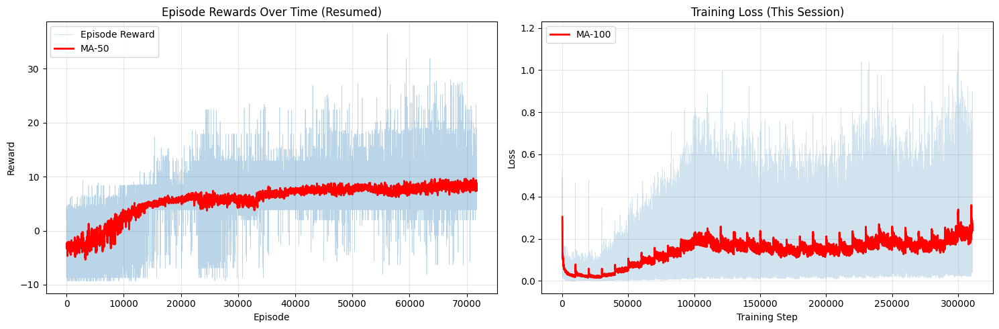


TRAINING SUMMARY
Training mode: RESUME
Total frames: 5,000,000
Total episodes: 71740
Average reward: 5.62 ± 4.31
Best reward: 36.40
Worst reward: -9.30
Last 50 eps avg: 7.49
Last 100 eps avg: 8.06
Avg episode length: 17.8
Final epsilon: 0.050
Training steps: 310,922
Replay buffer: 100,000/100,000


In [ ]:
# ============================================================================
# VISUALIZATION
# ============================================================================
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Plot 1: Episode Rewards
axes[0].plot(episode_rewards, alpha=0.3, label='Episode Reward', linewidth=0.5)
if len(episode_rewards) >= 50:
    window = min(50, len(episode_rewards))
    moving_avg = np.convolve(episode_rewards, np.ones(window)/window, mode='valid')
    axes[0].plot(range(window-1, len(episode_rewards)), moving_avg,
                    'r-', linewidth=2, label=f'MA-{window}')
axes[0].set_xlabel('Episode')
axes[0].set_ylabel('Reward')
title_suffix = " (Resumed)" if TRAINING_MODE == "resume" else ""
axes[0].set_title(f'Episode Rewards Over Time{title_suffix}')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Plot 2: Training Loss
if losses:
    axes[1].plot(losses, alpha=0.2, linewidth=0.5)
    if len(losses) >= 100:
        window = 100
        moving_avg = np.convolve(losses, np.ones(window)/window, mode='valid')
        axes[1].plot(range(window-1, len(losses)), moving_avg,
                       'r-', linewidth=2, label=f'MA-{window}')
    axes[1].set_xlabel('Training Step')
    axes[1].set_ylabel('Loss')
    title = 'Training Loss (This Session)' if TRAINING_MODE == "resume" else 'Training Loss'
    axes[1].set_title(title)
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
else:
    axes[1].text(0.5, 0.5, 'No loss data yet',
                    ha='center', va='center', transform=axes[1].transAxes)
    axes[1].set_title('Training Loss')

plt.tight_layout()
save_name = 'training_results_resumed.png' if TRAINING_MODE == "resume" else 'training_results.png'
plt.savefig(f'/content/{save_name}', dpi=150, bbox_inches='tight')
plt.show()

# ============================================================================
# SUMMARY
# ============================================================================
print("\n" + "="*60)
print("TRAINING SUMMARY")
print("="*60)
print(f"Training mode: {TRAINING_MODE.upper()}")
print(f"Total frames: {total_steps:,}")
print(f"Total episodes: {episode}")
print(f"Average reward: {np.mean(episode_rewards):.2f} \u00b1 {np.std(episode_rewards):.2f}")
print(f"Best reward: {np.max(episode_rewards):.2f}")
print(f"Worst reward: {np.min(episode_rewards):.2f}")
print(f"Last 50 eps avg: {np.mean(episode_rewards[-50:]):.2f}" if len(episode_rewards) >= 50 else "N/A")
print(f"Last 100 eps avg: {np.mean(episode_rewards[-100:]):.2f}" if len(episode_rewards) >= 100 else "N/A")
print(f"Avg episode length: {np.mean(episode_lengths):.1f}")
print(f"Final epsilon: {agent.epsilon():.3f}")
print(f"Training steps: {trainer.train_steps:,}")
print(f"Replay buffer: {len(replay_buffer):,}/{REPLAY_BUFFER_SIZE:,}")
print("="*60)

In [ ]:
# ============================================================================
# VISUALIZE TRAINED STATE-BASED AGENT
# ============================================================================
import matplotlib.pyplot as plt
import numpy as np

def visualize_state_agent(q_net, num_episodes=50, max_steps=2000, epsilon=0.0,
                         save_gif=False, gif_filename='flappy_agent.gif'):
    """
    Visualize the trained STATE-BASED agent playing Flappy Bird

    Args:
        q_net: Trained Q-network
        num_episodes: Number of episodes to play
        max_steps: Max steps per episode
        epsilon: Exploration rate (0.0 = pure exploitation)
        save_gif: Whether to save as GIF
        gif_filename: Filename for GIF
    """
    q_net.eval()  # Set to evaluation mode

    all_frames = []
    all_rewards = []
    all_steps = []

    print("="*60)
    print("VISUALIZING TRAINED STATE-BASED AGENT")
    print("="*60)

    # Create ONE environment with both state AND rendering
    if save_gif:
        env = gym.make("FlappyBird-v0", use_lidar=False, render_mode='rgb_array')
    else:
        env = gym.make("FlappyBird-v0", use_lidar=False)

    for ep in range(num_episodes):
        state, info = env.reset()

        episode_reward = 0
        episode_frames = [] if save_gif else None

        for step in range(max_steps):
            # Render frame if needed
            if save_gif:
                rgb_frame = env.render()
                episode_frames.append(rgb_frame.copy())

            # Select action from STATE (not image!)
            if np.random.random() < epsilon:
                action = env.action_space.sample()
            else:
                with torch.no_grad():
                    state_tensor = torch.FloatTensor(state).unsqueeze(0).to(device)
                    q_values = q_net(state_tensor)
                    action = q_values.argmax(1).item()

            # Step environment
            next_state, reward, terminated, truncated, info = env.step(action)

            done = terminated or truncated
            episode_reward += reward

            # Update state
            state = next_state

            if done:
                break

        if save_gif:
            all_frames.append(episode_frames)
        all_rewards.append(episode_reward)
        all_steps.append(step + 1)

        # Progress update
        if (ep + 1) % 10 == 0:
            print(f"Episode {ep+1}/{num_episodes}: Reward={episode_reward:.1f}, Steps={step+1}")

    env.close()

    print("\n" + "="*60)
    print("EVALUATION RESULTS")
    print("="*60)
    print(f"Episodes: {num_episodes}")
    print(f"Average reward: {np.mean(all_rewards):.2f} ± {np.std(all_rewards):.2f}")
    print(f"Median reward: {np.median(all_rewards):.2f}")
    print(f"Best reward: {np.max(all_rewards):.1f}")
    print(f"Worst reward: {np.min(all_rewards):.1f}")
    print(f"Average steps: {np.mean(all_steps):.1f}")
    print("="*60)

    # Save as GIF
    if save_gif and all_frames:
        try:
            import imageio
        except ImportError:
            print("Installing imageio...")
            import subprocess
            subprocess.check_call(["pip", "install", "imageio"])
            import imageio

        print(f"\nCreating GIF...")

        # Combine frames from first 5 episodes only
        combined_frames = []
        for i, frames in enumerate(all_frames[:5]):
            if i > 0:
                separator = np.ones_like(frames[0]) * 255
                combined_frames.extend([separator] * 3)

            combined_frames.extend(frames[::2])  # Every 2nd frame

        print(f"Saving {len(combined_frames)} frames to {gif_filename}...")
        imageio.mimsave(gif_filename, combined_frames, fps=15, loop=0)
        print(f"✓ GIF saved as {gif_filename}")

        # Download the GIF
        from google.colab import files
        files.download(gif_filename)

    q_net.train()  # Set back to training mode
    return all_rewards, all_steps

# ============================================================================
# LOAD TRAINED MODEL AND VISUALIZE
# ============================================================================

# Load the trained model
checkpoint_path = "/content/checkpoints/final_model_state_based.pth"
print(f"Loading model from {checkpoint_path}...")

checkpoint = torch.load(checkpoint_path)
q_net.load_state_dict(checkpoint['q_net_state_dict'])
print("✓ Model loaded!")

# Visualize the agent playing
print("\nEvaluating agent...")
rewards, steps = visualize_state_agent(
    q_net=q_net,
    num_episodes=10,  # 10 episodes for good statistics
    max_steps=2000,
    epsilon=0.0,  # Pure exploitation
    save_gif=True,  # Save GIF of first 5 episodes
    gif_filename='flappy_bird_state_agent.gif'
)

Loading model from /content/checkpoints/final_model_state_based.pth...
✓ Model loaded!

Evaluating agent...
VISUALIZING TRAINED STATE-BASED AGENT
Episode 10/10: Reward=31.9, Steps=276

EVALUATION RESULTS
Episodes: 10
Average reward: 21.65 ± 21.76
Median reward: 13.30
Best reward: 82.9
Worst reward: 8.5
Average steps: 193.3

Creating GIF...
Saving 590 frames to flappy_bird_state_agent.gif...
✓ GIF saved as flappy_bird_state_agent.gif


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

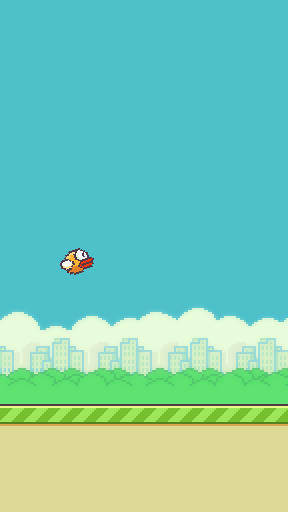

In [ ]:
from IPython.display import Image, display

# Display the GIF
display(Image(filename='/content/flappy_bird_state_agent.gif'))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Test

In [ ]:
buffer = [0, 1, 2, 3, 4]
print(buffer)
buffer = np.roll(buffer, -1, axis=0)
print(buffer)
buffer[-1] = 5
print(buffer)

[0, 1, 2, 3, 4]
[1 2 3 4 0]
[1 2 3 4 5]


In [ ]:
q = deque([0,1,2,3,4])
print(q)
q.popleft()
print(q)
q.append(5)
print(q)

deque([0, 1, 2, 3, 4])
deque([1, 2, 3, 4])
deque([1, 2, 3, 4, 5])


TypeError: Image data of dtype object cannot be converted to float

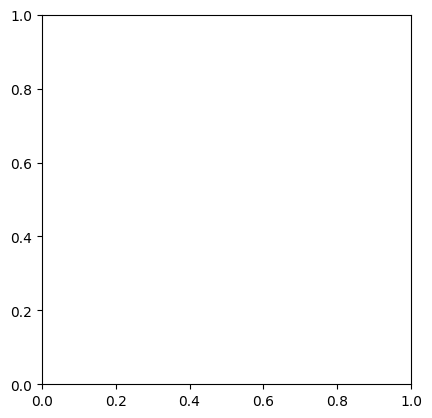

In [ ]:
img = cv2.imread("/content/flappy_bird.png")
plt.imshow(img)

In [ ]:
rescaled_frame = preprocess("/content/flappy_bird.png", "/content/flappy_bird.png")
rescaled_frame

# Notes
- `float32` and `uint8` represent different data types designed for different purposes (esp. for memory usage, precision, and range).
  - `uint8` is 4x more memory-efficient than `float32` because the former stores 1 byte/element while the latter 4 bytes/element
  - As a result, we can use `uint8` to store image data while `float32` to store neural network weights or image normalization (0.0 to 1.0)